# Práctica 4: Eigenfaces

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## The dataset: Some familiar faces

Vamos a leer del archivo 'train_list' el número de rostros que se utilizaron para entrenar los modelos y hacer una lista:

In [ ]:
with open('/content/drive/MyDrive/ColabArchivos/faces/train_list','r') as f:
    data_train = f.read().split('\n')
data_train[:10]

['1227',
 '1234',
 '1262',
 '1266',
 '1290',
 '1313',
 '1353',
 '1400',
 '1414',
 '1451']

Leemos los datos crudos para las imagenes de entrenamiento, los transformamos a imagenes de $128 \times 128$ y los ponemos en un arreglo tridimensional (imagen, filas, columnas):

In [ ]:
min_rows, min_cols = 128, 128

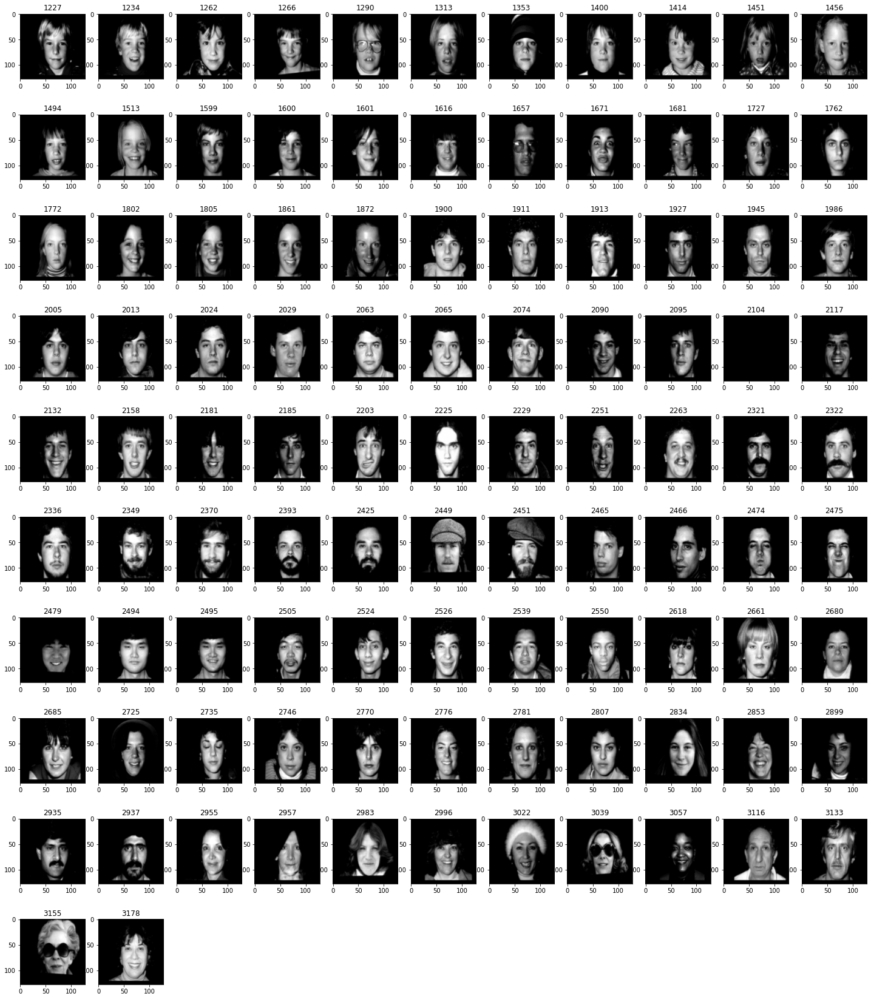

In [ ]:
dtype = np.dtype('B')

plt.figure(figsize=(25,30))
img0 = np.zeros([len(data_train)-1,128,128])

for i,img_raw in enumerate(data_train[:-1]):
    with open('/content/drive/MyDrive/ColabArchivos/rawdata/'+img_raw, "rb") as f:
        # numpy_data = np.fromfile(f,dtype)
        # print(len(numpy_data))
        img0[i,:,:] = np.fromfile(f,dtype).reshape(min_rows, min_cols)
        plt.subplot(10,11,i+1)
        plt.title(img_raw)
        plt.imshow(img0[i,:,:],cmap='gray')
plt.show()

## Preprocessing the images

Las imágenes ya cuentan con la misma cantidad de columnas y de filas. También se cuentran ya centradas. Vamos a retirar la imagen 2104:

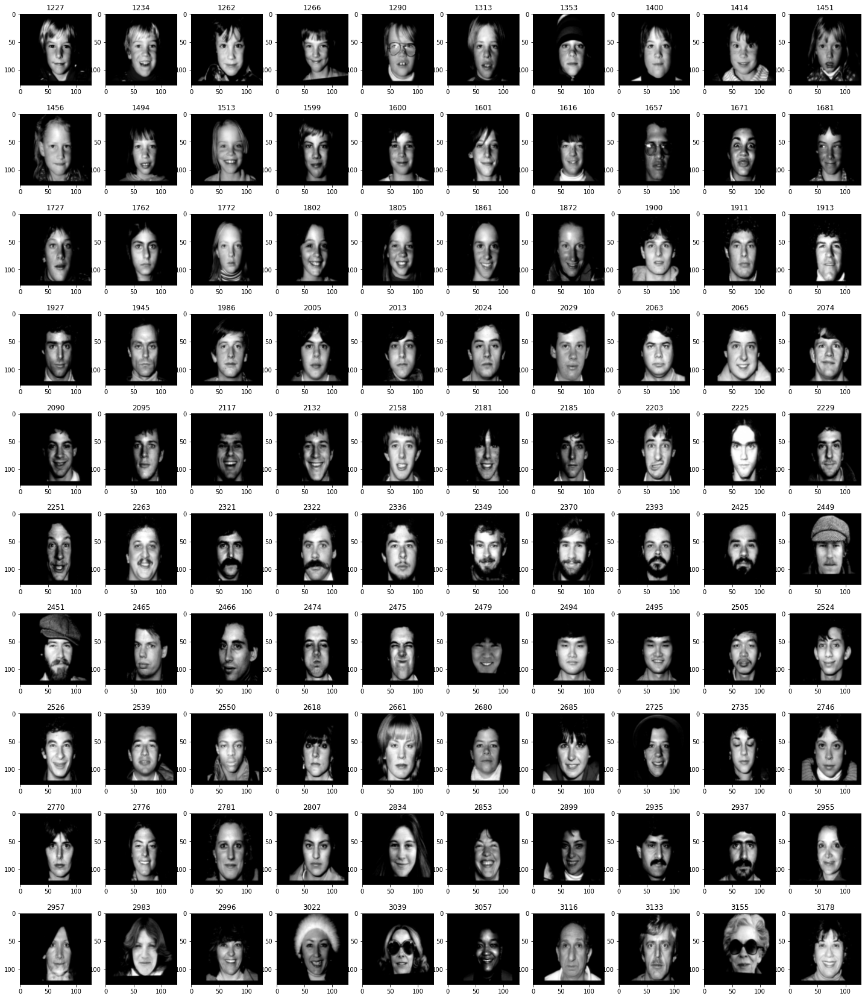

In [ ]:
data_train = data_train[:-1]
data_train.remove('2104')

plt.figure(figsize=(25,30))
img0 = np.zeros([len(data_train),128,128])

for i,img_raw in enumerate(data_train):
    with open('/content/drive/MyDrive/ColabArchivos/rawdata/'+img_raw, "rb") as f:
        img0[i,:,:] = np.fromfile(f,dtype).reshape(min_rows, min_cols)
        plt.subplot(10,10,i+1)
        plt.title(img_raw)
        plt.imshow(img0[i,:,:],cmap='gray')
plt.show()

### Promedio de imágenes por pixel

Calculamos una imagen promedio, promediando todos los pixeles de las imágenes de una misma posición.

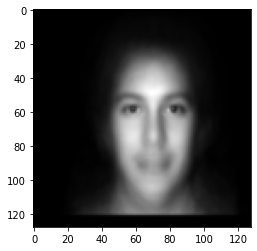

In [ ]:
img_avg=img0.mean(axis=0)
plt.imshow(img_avg,cmap='gray')

A cada una de las imagenes le restamos el promedio anteriormente calculado:

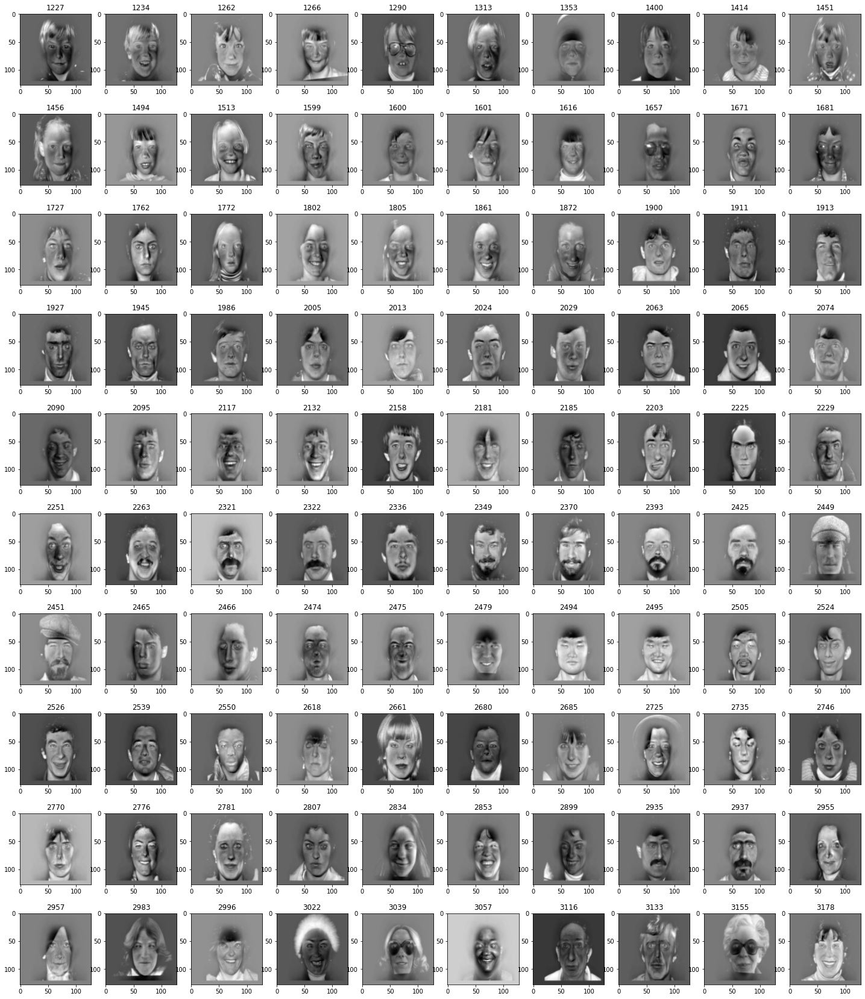

In [ ]:
plt.figure(figsize=(25,30))
img_cen = img0-img_avg
for i,imgCen in enumerate(img_cen):
    # img_cen = img[i,:,:]-img_avg
    plt.subplot(10,10,i+1)
    plt.title(data_train[i])
    plt.imshow(imgCen,cmap='gray')
plt.show()

### From image set to a data matrix and back again

'Aplanamos' las imagenes, para tener arreglos de una dimensión por cada imagen

In [ ]:
m = len(img_cen)
d = min_rows * min_cols
X = np.reshape(img_cen, (m, d))
X.shape

(100, 16384)

## Applying PCA

In [ ]:
U, Sigma, VT = np.linalg.svd(X, full_matrices=False)
# Sanity check on dimensions
print("X:", X.shape)
print("U:", U.shape)
print("Sigma:", Sigma.shape)
print("V^T:", VT.shape)

X: (100, 16384)
U: (100, 100)
Sigma: (100,)
V^T: (100, 16384)


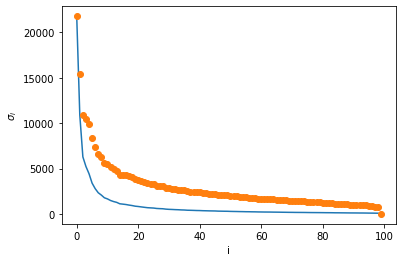

In [ ]:
x = np.linspace(1,100,len(Sigma))
plt.plot(Sigma/np.sqrt(x))
plt.plot(Sigma,'o')
plt.xlabel("i")
plt.ylabel(u"$\sigma_i$")
plt.show()

### Principal components

$$  A_k =  \sigma_1 u_1 v_1^T + \sigma_2 u_2 v_2^T + ... + \sigma_k u_k v_k^T $$

let’s plot the first few principal components

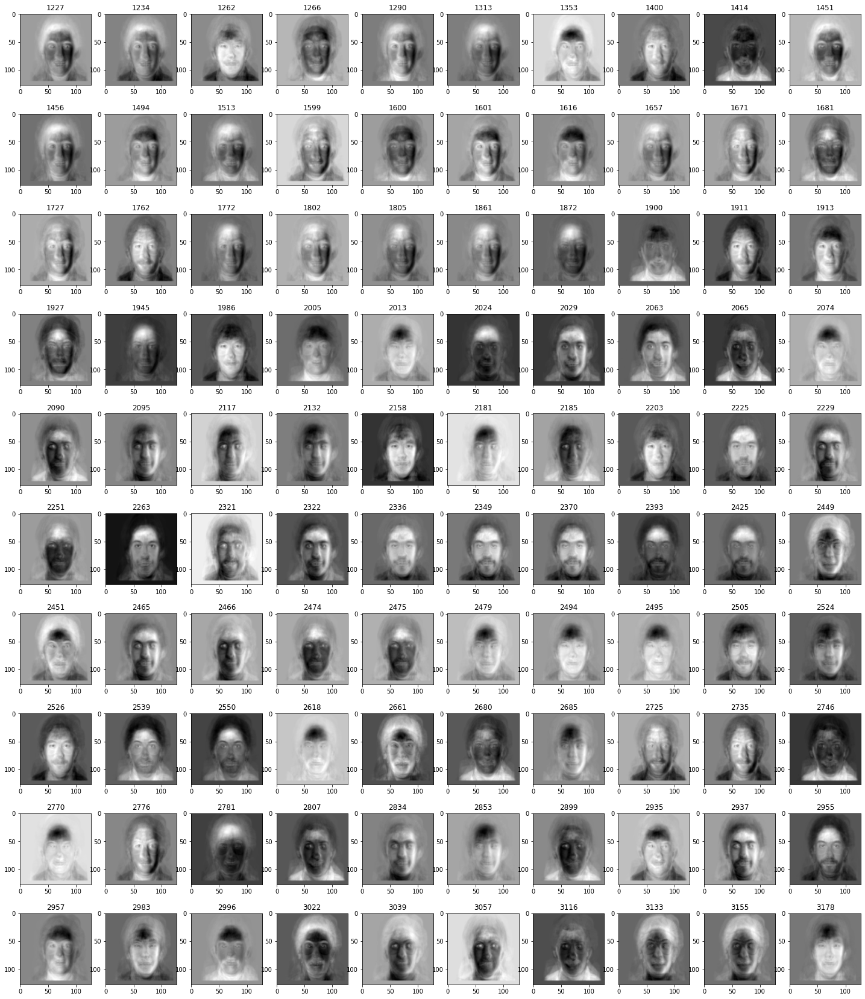

In [ ]:
num=5
Ak=Sigma.reshape([100,1])*U[:,:num]@VT[:num,:]
Ak=Ak.reshape([100,min_rows, min_cols])
plt.figure(figsize=(25,30))
for i,img in enumerate(Ak):
    plt.subplot(10,10,i+1)
    plt.title(data_train[i])
    plt.imshow(img,cmap='gray')
plt.show()

Función para mostrar la recontrucción de un número de imagen numImg con cierto número de eigenvalores eigval:

In [ ]:
def faceRecon(eigval,numImg):
    Ak=Sigma.reshape([Sigma.shape[0],1])*U[:,:eigval]@VT[:eigval,:]
    Ak=Ak.reshape([Ak.shape[0],min_rows, min_cols])
    recon=Ak+img_avg
    
    plt.figure(figsize=(7,10))

    plt.subplot(1,2,1)
    plt.title(data_train[numImg])
    plt.imshow(recon[numImg,:,:],cmap='gray')

    plt.subplot(1,2,2)
    plt.title(data_train[numImg])
    plt.imshow(img0[numImg,:,:],cmap='gray')

    plt.show()

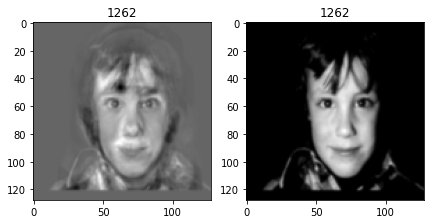

In [ ]:
faceRecon(25,2)

Now let’s compute a new matrix Y, which is the original data matrix projected onto the first num_components principal components.

In [ ]:
num_components = 5 # Number of principal components
Y = np.matmul(X, VT[:num_components,:].T)
Y.shape

(100, 5)

The next plot visualizes the face datapoints projected on the first two principal components with bokeh with the thumbnails as the face images.

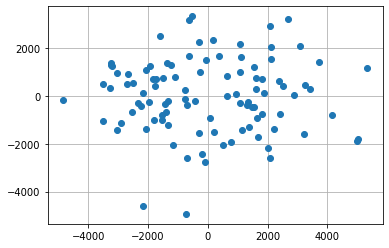

In [ ]:
plt.plot(Y[:,0],Y[:,1],'o')
plt.grid()

## K-means

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(Y[:,:2])

In [ ]:
d = {}
d['image'] = data_train
d['class'] = kmeans.labels_
# data['image'] = data_train
faceGroups=pd.DataFrame(data = d)
faceGroups.head()

,image,class
0,1227,0
1,1234,2
2,1262,1
3,1266,0
4,1290,1


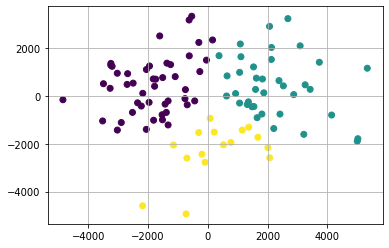

In [ ]:
colors = ['r','b','g']
plt.scatter(Y[:,0],Y[:,1], c=kmeans.labels_.astype(float))
plt.grid()

Mostrar los rostros de un grupo

In [ ]:
def showGruoup(df=faceGroups,group = 2):
  dtype = np.dtype('B')
  plt.figure(figsize=(25,30))

  for i,img_raw in enumerate(df[df['class']==group]['image']):
      with open('/content/drive/MyDrive/ColabArchivos/rawdata/'+img_raw, "rb") as f:
          imagen = np.fromfile(f,dtype).reshape(min_rows, min_cols)
          plt.subplot(10,11,i+1)
          plt.title(img_raw)
          plt.imshow(imagen,cmap='gray')
  plt.show()

**Del grupo 0**

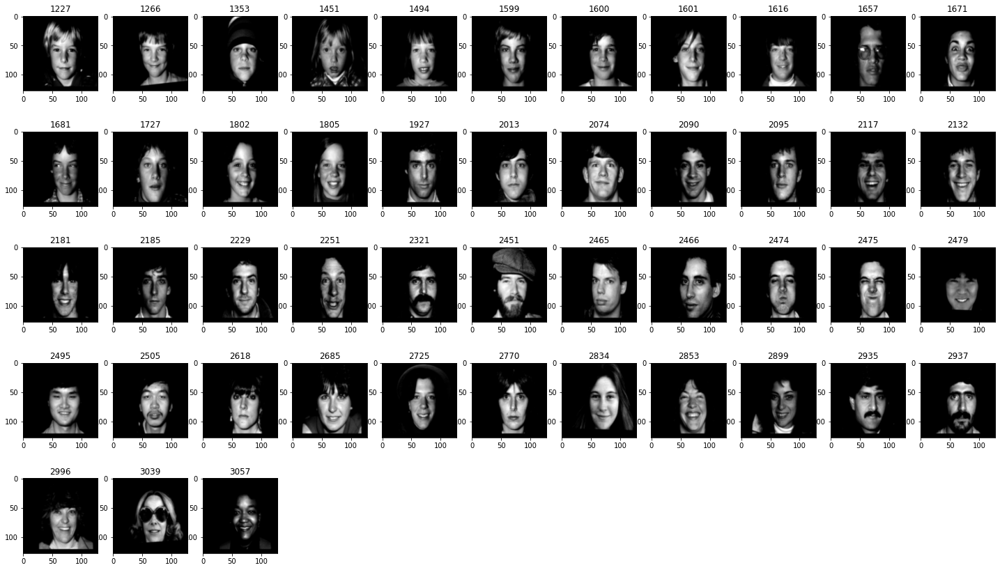

In [ ]:
showGruoup(df=faceGroups,group = 0)

**Del grupo 1**

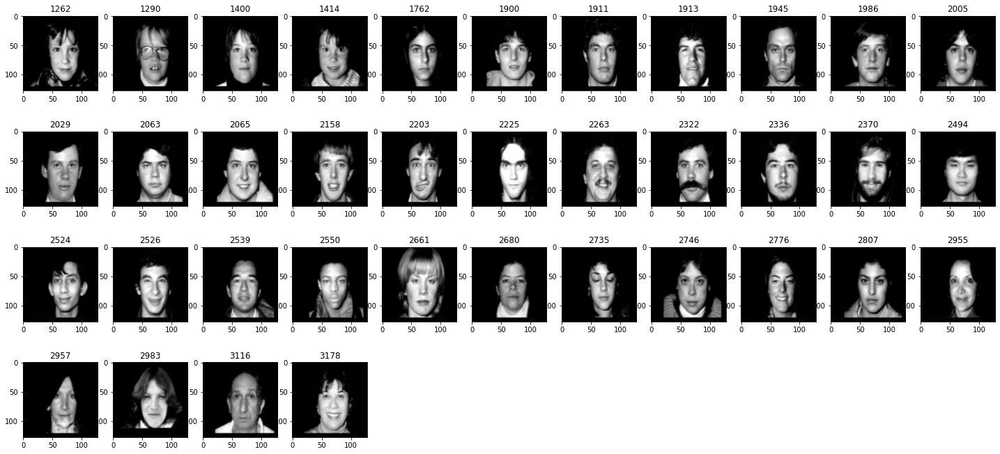

In [ ]:
showGruoup(df=faceGroups,group = 1)

**Del grupo 2**

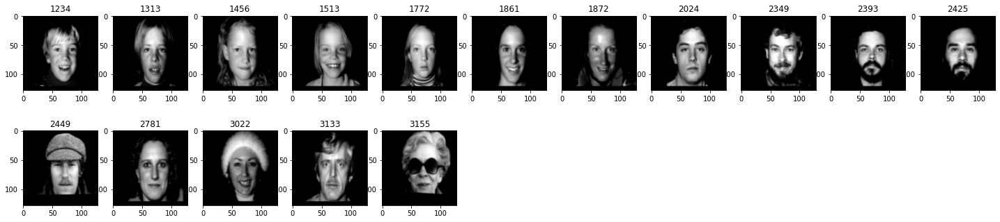

In [ ]:
showGruoup(df=faceGroups,group = 2)

## Face Reconstruction and A  Simple Face Detector

Leemos los nombres de las imágenes

In [ ]:
import os
faces = os.listdir('/content/drive/MyDrive/ColabArchivos/reconstruction/faces')
faces[:20]

['Ai_Sugiyama_0005.pgm',
 'George_W_Bush_0021.pgm',
 'Michael_Bloomberg_0020.pgm',
 'Atal_Bihari_Vajpayee_0014.pgm',
 'David_Welch_0001.pgm',
 'John_Ashcroft_0010.pgm',
 'Ellen_Barkin_0001.pgm',
 'Hillary_Clinton_0010.pgm',
 'Jean_Chretien_0014.pgm',
 'Hugo_Chavez_0029.pgm',
 'Roman_Polanski_0001.pgm',
 'Paul_ONeill_0003.pgm',
 'Tab_Turner_0001.pgm',
 'Bob_Colvin_0002.pgm',
 'Hans_Eichel_0003.pgm',
 'Josh_Childress_0001.pgm',
 'Elisabeth_Welch_0001.pgm',
 'Darvis_Patton_0001.pgm',
 'Jeffrey_Katzenberg_0001.pgm',
 'Daisy_Fuentes_0004.pgm']

Usamos una función de (https://stackoverflow.com/questions/35723865/read-a-pgm-file-in-python) para leer archivos pgmf

In [ ]:
def read_pgm(pgmf):
    """Return a raster of integers from a PGM as a list of lists."""
    pgmf.readline() == 'P5\n'
    (width, height) = [int(i) for i in pgmf.readline().split()]
    depth = int(pgmf.readline())
    assert depth <= 255

    raster = []
    for y in range(height):
        row = []
        for y in range(width):
            row.append(ord(pgmf.read(1)))
        raster.append(row)
    return raster

Mostramos algunas de los rostros

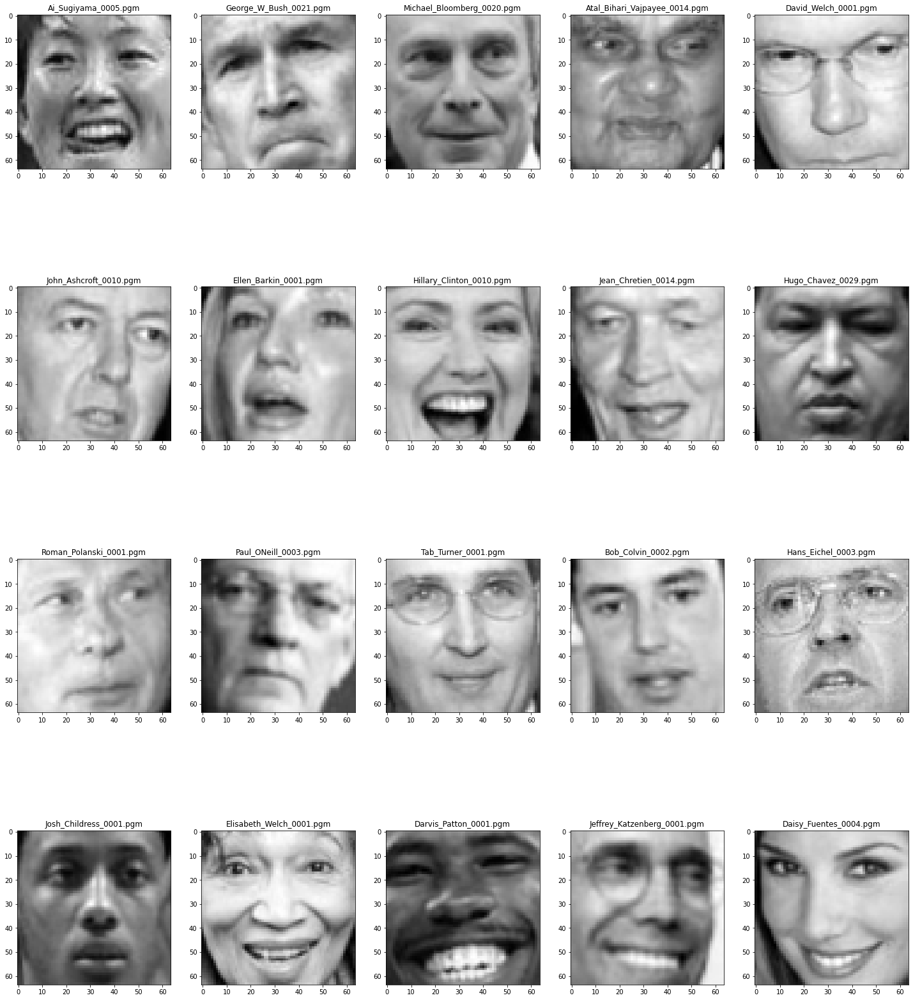

In [ ]:
plt.figure(figsize=(25,30))

for i,img_raw in enumerate(faces[:20]):
    with open('/content/drive/MyDrive/ColabArchivos/reconstruction/faces/'+img_raw, "rb") as f:
        plt.subplot(4,5,i+1)
        plt.title(faces[i])
        #plt.imshow(read_pgm(f),cmap='gray')
        plt.imshow(plt.imread(f),cmap='gray')   #probamos a ver si funciona con imread pero no lo hizo :(
plt.show()

### Computing the EigenFaces

### STEP1 Obtain face images $I_i$ (training faces)

In [ ]:
fimg = np.zeros([len(faces),64,64])
for i,img_raw in enumerate(faces):
    try:
      with open('/content/drive/MyDrive/ColabArchivos/reconstruction/faces/'+img_raw, "rb") as f:
          #fimg[i,:,:] = read_pgm(f)
          fimg[i,:,:] = plt.imread(f)
    except:
      continue

In [ ]:
fimg.shape

(13233, 64, 64)

### STEP2 Represent every image $I_i$ as a vector $\Gamma_i$

In [ ]:
gamma=fimg.reshape([fimg.shape[0],fimg.shape[1]*fimg.shape[2]])
gamma.shape

(13233, 4096)

### STEP3  Compute the average face vector $Ψ = \frac{1}{M}Σ_{i=1}^M Γ_{i}$

In [ ]:
psi = gamma.mean(axis=0)
psi.shape

(4096,)

### STEP4 Subtract the mean face $\phi_i = \Gamma_i - \Psi $

In [ ]:
phi = gamma  - psi
phi.shape

(13233, 4096)

### STEP 5 Compute the covariance matrix C:

In [ ]:
A = phi.T
C = A @ A.T
C.shape

(4096, 4096)

### STEP6 Compute the eigenvectors $u_i$ of $AA^T$

#### STEP6.1 Consider the matrix $A^TA$ 

In [ ]:
C1 = A.T @ A
C1.shape

(13233, 13233)

Notemos algo importante, la lógica de este algoritmo es reducir las dimensiones de la matriz $AA^T$ utilizando $A^TA$ para obtener M eigenvalores y eigenvectores que serán los M mejores eigenvectores de $AA^T$ dados por los M mayores eigenvalores de esa matriz.

Como en este caso las dimensiones de las imagenes son muy pequeñas y tenemos muchas imágenes la lógica de este algoritmo ya no se respeta. Sin embargo suena coherente que en ejemplos prácticos se respete que $M<N^2$.

#### 6.2 Compute the eigenvectors $v_i$ of $A^T A$:

$$ A^TAv_i = \mu_i v_i $$
$AA^T$ and $A^TA$ have the same eigenvalues and theit eigenvectors are related as follows $u_i = Av_i$

In [ ]:
lam,v=np.linalg.eig(C1) #se obtiene de la matriz de MxM
print(v.shape)
print(lam)

Después de 25 minutos no terminó de cargar así que calcularemos directo los eigenvalores de la matriz C. Nos saltaremos el paso 6.3 pero se encuentra programado abajo por si se desea aplicar en otro conjunto de imágenes.

La función linalg.eig() da un vector con valores propios lam y una matriz compuesta de los vectores propios dado como $v_{i}=v[:,i]$ para el valor propio $\mu_{i}=lam[i]$.

Fuente: https://numpy.org/doc/stable/reference/generated/numpy.linalg.eig.html

#### STEP 6.3 Compute the M best eigenvectors of $AA^T$:

$$u_i = Av_i$$

In [ ]:
ui = A@v
ui_n = ui/np.linalg.norm(ui)   #se normalizan los vectores propios
ui_n.shape

In [ ]:
print(ui_n)
print(np.linalg.norm(ui))

### STEP 7 keep only K eigenvectors (corresponding to the K largest eigenvalues)

Se calcula directo los eigenvectores y eigenvalores de la matriz C. La diferencia en tiempo es mucha dado a que lo calculó en un minuto. Se podría en caso de querer aplicar un algoritmo general poder hacer un comparador que indique cual de los dos matrices conviene más ocupar para calcular los vectores.

In [ ]:
lam2,v2=np.linalg.eig(C)  #se obtiene de la matriz de N^2xN^2
v2_n = v2/np.linalg.norm(v2)   #se normalizan los vectores propios
print(v2_n.shape)
print(lam2)

(4096, 4096)
[2.73438628e+10 1.22346072e+10 5.94536570e+09 ... 2.03273231e+03
 2.01016046e+03 2.00870493e+03]


Una vez obtenidos los eigenvalores y eigenvectores necesitamos obtener sólo k eigenvectores los cuales seanlos de los los K mayores. Para lograrlo anterior usamos la función argsort() la cual da un array de índices de los valores de menor a menor por lo que debemos manipularlo para que nos de los k mayores y además que esté ordenado de mayor a menor.
Fuentes: https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array

https://numpy.org/doc/stable/reference/generated/numpy.argsort.html

In [ ]:
k=3
ind=np.flipud(np.argsort(lam2))[:k]   #selecciona los k mayores eigenvalores
uk=v2_n[:,ind]            #conjunto de k eigenvectores
print(uk.shape)

(4096, 3)


In [ ]:
ind

array([0, 1, 2])

**Meanface**

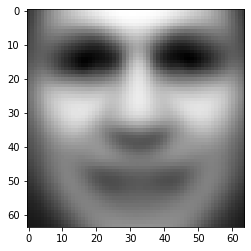

In [ ]:
plt.imshow(psi.reshape([64,64]),cmap='gray') #Michael Myers jaja

**Eigenfaces**

Top 100

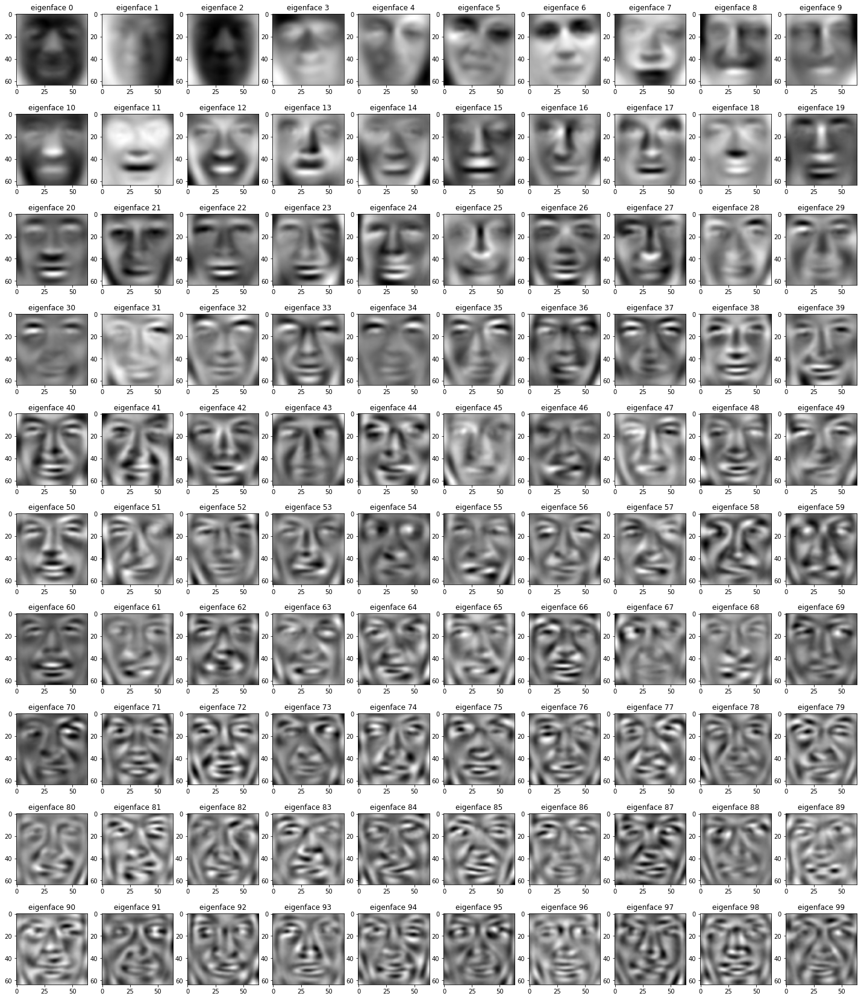

In [ ]:
k=100
ind=np.flipud(np.argsort(lam2))[:k]   #selecciona los k mayores eigenvalores
uk=v2_n[:,ind]            #conjunto de k eigenvectores
plt.figure(figsize=(25,30))
Ak=uk.T.reshape([k,64, 64])
for i,img in enumerate(Ak):
    plt.subplot(10,10,i+1)
    plt.title('eigenface '+str(i))
    plt.imshow(img,cmap='gray')
plt.show()

Top 400

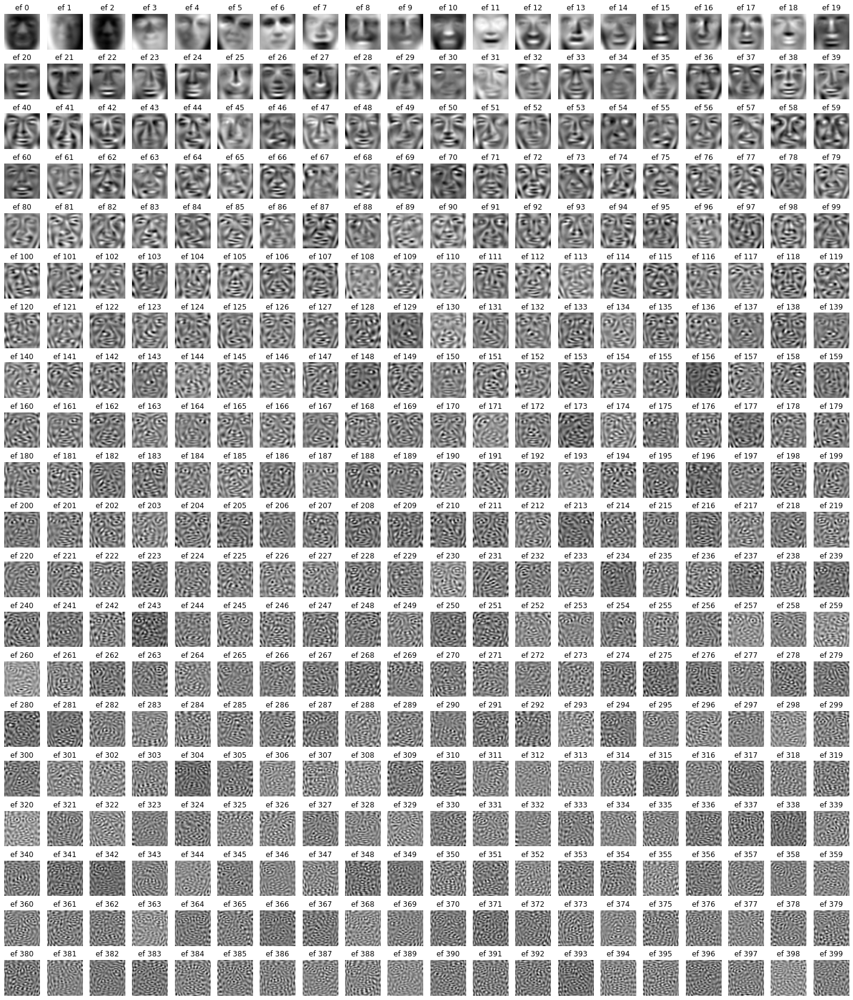

In [ ]:
k=400
ind=np.flipud(np.argsort(lam2))[:k]   #selecciona los k mayores eigenvalores
uk=v2_n[:,ind]            #conjunto de k eigenvectores
plt.figure(figsize=(25,30))
Ak=uk.T.reshape([k,64, 64])
for i,img in enumerate(Ak):
    plt.subplot(20,20,i+1)
    plt.title('ef '+str(i))
    plt.imshow(img,cmap='gray')
    plt.axis('off')
plt.show()

Ahora basta proyectar la imagen con nuestros eigenvectores para obtener los coeficientes que den como resultado nuestra imagen al operarlos con los eigenvectores.

(4096, 1)
(64, 64)


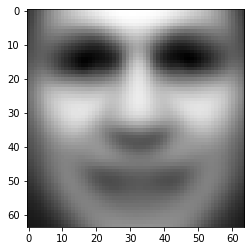

In [ ]:
im=0                      #imagen a proyectar
k=4096                       #k eigenfaces
ind=np.flipud(np.argsort(lam2))[:k]   #selecciona los k mayores eigenvalores
uk=v2_n[:,ind]            #conjunto de k eigenvectores
kcoef = np.matmul(uk.T,phi[im,:])
kcoef=kcoef.reshape([k,1])
print(kcoef.shape)
recon=np.matmul(kcoef.T,uk.T)
recon=recon.reshape([64,64])
print(recon.shape)
plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
#plt.imshow(recon,cmap='gray')                             
plt.show()

Se tenía un problema como el de arriba en el que al momento de sumar el promedio a la imagen reconstruida sólo se podía apreciar el promedio.

Platicando en clase se pensó que los errores podían ser por la función utilizada para leer la imagen, así que se leyó con imread() de matplotlib pero el error se mantenía y las reconstrucciones tenían los mismos valores.

Al final se notó que si se normaliza el eigenvector se deben normalizar también las eigenfaces, si no se normaliza el eigenvector entonces se pueden ocupar las imágenes sin normalizar y obtenemos la reconstrucción debida.

(4096, 1)
(64, 64)


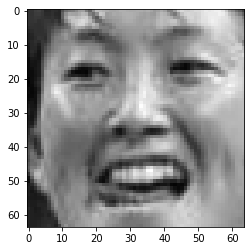

In [ ]:
im=0                      #imagen a proyectar
k=4096                       #k eigenfaces
ind=np.flipud(np.argsort(lam2))[:k]   #selecciona los k mayores eigenvalores
uk=v2[:,ind]            #conjunto de k eigenvectores
kcoef = np.matmul(uk.T,phi[im,:])
kcoef=kcoef.reshape([k,1])
print(kcoef.shape)
recon=np.matmul(kcoef.T,uk.T)
recon=recon.reshape([64,64])
print(recon.shape)
plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
#plt.imshow(recon,cmap='gray')                             
plt.show()

Creamos ahora la animación de la reconstrucción de la imagen:

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML


Aquí se usó el método lento donde se calculan los coeficientes dentro del ciclo for.

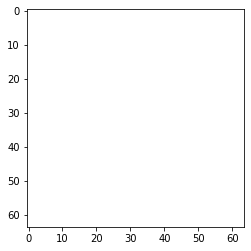

In [ ]:
fig=plt.figure()
im=0
ims=[]
stop=4096

for k in range(1,stop+1):
  ind=np.flipud(np.argsort(lam2))[:k]
  uk=v2[:,ind]
  kcoef=np.matmul(uk.T,phi[im,:])
  recon=np.matmul(kcoef.T,uk.T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

plt.show()


In [ ]:
HTML(ani.to_html5_video())

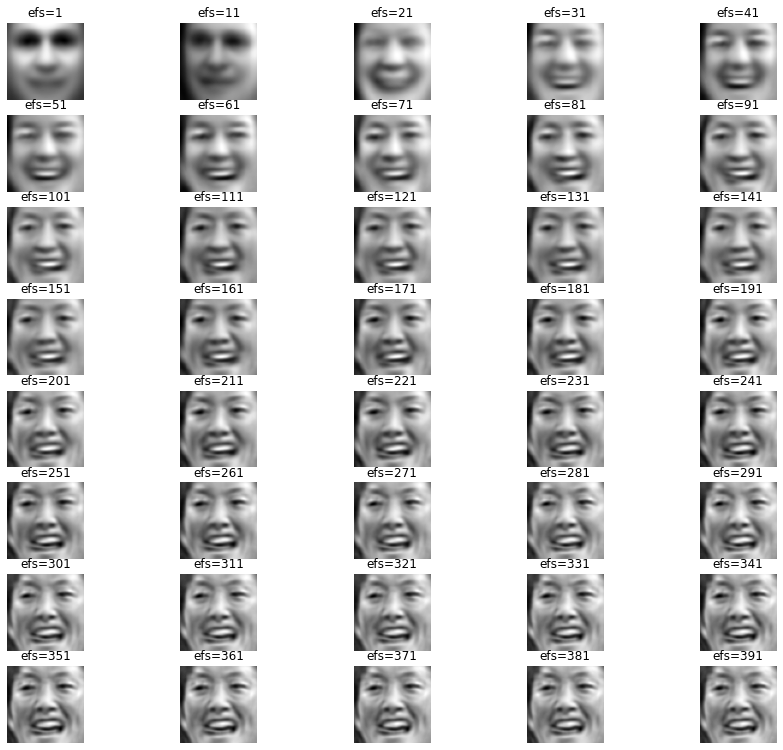

In [ ]:
plt.figure(figsize=(15,20))
im=0
stop=400

for i,k in enumerate(range(1,stop+1,10)):
  ind=np.flipud(np.argsort(lam2))[:k]
  uk=v2[:,ind]
  kcoef=np.matmul(uk.T,phi[im,:])
  recon=np.matmul(kcoef.T,uk.T)
  recon=recon.reshape([64,64])
  plt.subplot(12,5,i+1)
  plt.title('efs='+str(k))
  plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
  plt.axis('off')
plt.show()

In [ ]:
im=0
stop=400

for i,k in enumerate(range(1,stop+1,10)):
  ind=np.flipud(np.argsort(lam2))[:k]
  uk=v2_n[:,ind]
  kcoef=np.matmul(uk.T,phi[im,:])
  recon=np.matmul(kcoef.T,uk.T)
  recon=recon.reshape([64,64])
  diff=abs(recon*255-fimg[im])
  error=sum(sum(diff))
  print(np.max(recon))
plt.show()

-0.0005634781490328948
0.017167213007507533
0.014306429690783018
0.016760939981751363
0.018230453465335937
0.019016287057609955
0.019304123364709012
0.019716002250939352
0.020823917504129253
0.021820309203909965
0.023146809399678225
0.02589417287499947
0.024580902734616782
0.024923902000494484
0.024158725499158543
0.024303648969348727
0.024412341801724056
0.024177138752764265
0.023366966545287134
0.024131092611293686
0.024988943818725535
0.025922757742823245
0.02565555959947696
0.025388622628003347
0.02609576174529617
0.02539275186443351
0.027384687554943415
0.027615042579611348
0.02706865975046468
0.026370282686171625
0.027082663838367892
0.026554916749502736
0.02691606299652532
0.026083134703475407
0.025660068253011592
0.02598468077716885
0.02520980116634417
0.025614333051673304
0.025197832069772174
0.025619494873556005


In [ ]:
im=0
stop=4096

for i,k in enumerate(range(1,stop+1,10)):
  ind=np.flipud(np.argsort(lam2))[:k]
  uk=v2[:,ind]
  kcoef=np.matmul(uk.T,phi[im,:])
  recon=np.matmul(kcoef.T,uk.T)
  recon=recon.reshape([64,64])
  diff=abs(recon+psi.reshape([64,64])-fimg[im])
  error=sum(sum(diff))
  print(np.max(recon))
  print('El error es de '+str(error))
plt.show()

-2.308006498438731
El error es de 131531.91373904198
70.31690447875067
El error es de 103712.00866791277
58.59913601344708
El error es de 79898.41091922588
68.6528101652534
El error es de 66663.51800569176
74.67193739401581
El error es de 65435.03364739115
77.89071178797018
El error es de 62489.00845106329
79.06968930184792
El error es de 59087.159650078785
80.75674521984736
El error es de 54030.42583481538
85.29476609691315
El error es de 49333.47949818787
89.37598649921492
El error es de 47515.59688862822
94.80933130108177
El error es de 45564.86076453072
106.06253209599754
El error es de 43608.63627843213
100.68337760099008
El error es de 43104.61749083892
102.08830259402514
El error es de 41734.15717221183
98.95413964455315
El error es de 41461.24428600937
99.54774617845214
El error es de 40587.401435513566
99.9929520198614
El error es de 39662.94116799027
99.0295603313221
El error es de 37880.790920715284
95.71109496949587
El error es de 37443.27456470604
98.84095533585867
El erro

Los valores de la imagen reconstruida son demasiado pequeños si sólo se normaliza los eigenvectores. Si no se normaliza nada ahora los valores ya son comparables y ya podría calcularse un error en forma de diferencia.

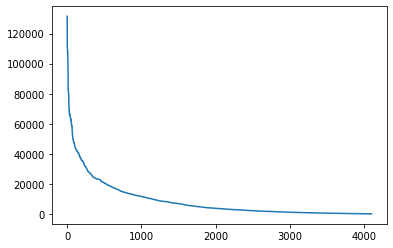

In [ ]:
im=0
k=4096
stop=4096
error=[]

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for i,k in enumerate(range(1,stop+1)):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  diff=abs(recon+psi.reshape([64,64])-fimg[im])
  err=sum(sum(diff))
  error.append([err])

plt.plot(np.linspace(1,4096,4096),error)
plt.show()

In [ ]:
x=np.linspace(1,4096,4096)
print(error)

[[131531.91373904198], [112471.52386308603], [110484.77031103578], [109945.8898210711], [109573.25326567887], [108039.9605553302], [108178.5113909138], [107708.63454567063], [105433.7973869239], [104055.4439228799], [103712.00866791277], [97627.05945128869], [96742.33577777036], [81879.09346205731], [81506.549714458], [81457.71625527096], [81439.24541817303], [81235.74913624737], [80439.69956627535], [79971.56189133666], [79898.41091922588], [79699.61148123472], [73371.13783706521], [71847.4215915999], [71826.04339279399], [70189.91991679548], [70165.6854952317], [68757.52232473981], [68750.5164954178], [66763.71099265036], [66663.51800569176], [66681.54287483991], [66630.81443143205], [66614.56600923734], [66615.81345765827], [66648.83656683803], [65632.4479847655], [65717.10563242543], [65771.02804558893], [65425.120698889776], [65435.03364739115], [65170.27703813922], [63996.73133754876], [63962.293137626075], [64028.99823814653], [63989.89035416842], [63892.10810625825], [63429.803

Probamos con la imagen de otra persona.

Aquí ya usamos el método rápido de sacar los coeficientes.

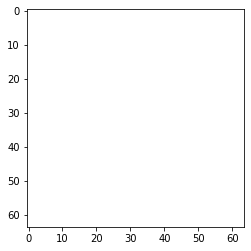

In [ ]:
fig=plt.figure()
im=1
ims=[]
k=4096
stop=4096

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for k in range(1,stop+1,):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani2 = animation.ArtistAnimation(fig, ims, interval=25, blit=True,
                                repeat_delay=1000)


In [ ]:
HTML(ani2.to_html5_video())

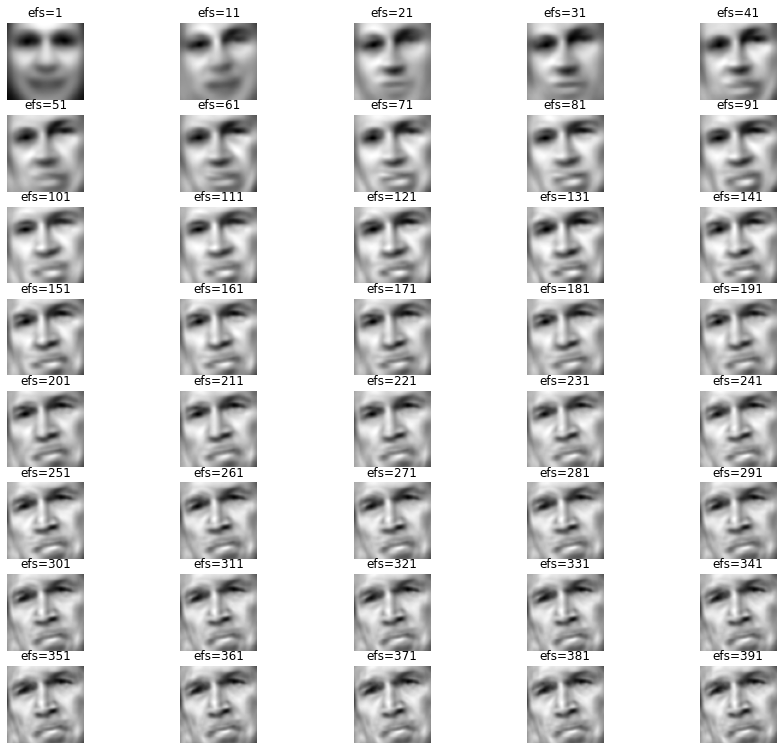

In [ ]:
plt.figure(figsize=(15,20))
k=4096
im=1
stop=400

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for i,k in enumerate(range(1,stop+1,10)):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  plt.subplot(12,5,i+1)
  plt.title('efs='+str(k))
  plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
  plt.axis('off')
plt.show()

In [ ]:
print(uk[:k,:].shape)

(391, 4096)


Ahora vamos a probar con imágenes de aniamles para ver si se puede reconstruir imágenes de animales.

In [ ]:
import skimage.io as sk
from skimage.color import rgb2gray

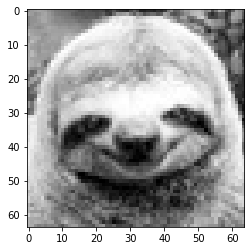

In [ ]:
pere=sk.imread('/content/drive/MyDrive/ColabArchivos/reconstruction/pere.jpg',as_gray=True)*255  #Los valores están de 0 a 1
plt.imshow(pere,cmap='gray')
plt.show()

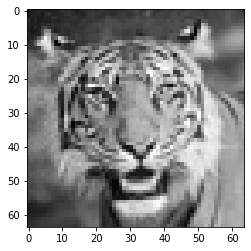

In [ ]:
tigre=sk.imread('/content/drive/MyDrive/ColabArchivos/reconstruction/tigre.jpg',as_gray=True)*255
plt.imshow(tigre,cmap='gray')
plt.show()

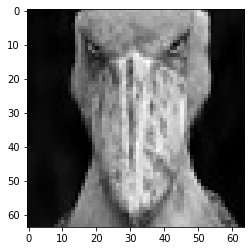

In [ ]:
pico=sk.imread('/content/drive/MyDrive/ColabArchivos/reconstruction/picozapato.jpg',as_gray=True)*255
plt.imshow(pico,cmap='gray')
plt.show()

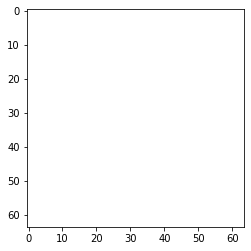

In [ ]:
fig=plt.figure()
k=4096
stop=4096
ims=[]

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pere.reshape([4096])-psi)

for k in range(1,stop+1,):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani3 = animation.ArtistAnimation(fig, ims, interval=25, blit=True,
                                repeat_delay=1000)


In [ ]:
HTML(ani3.to_html5_video())

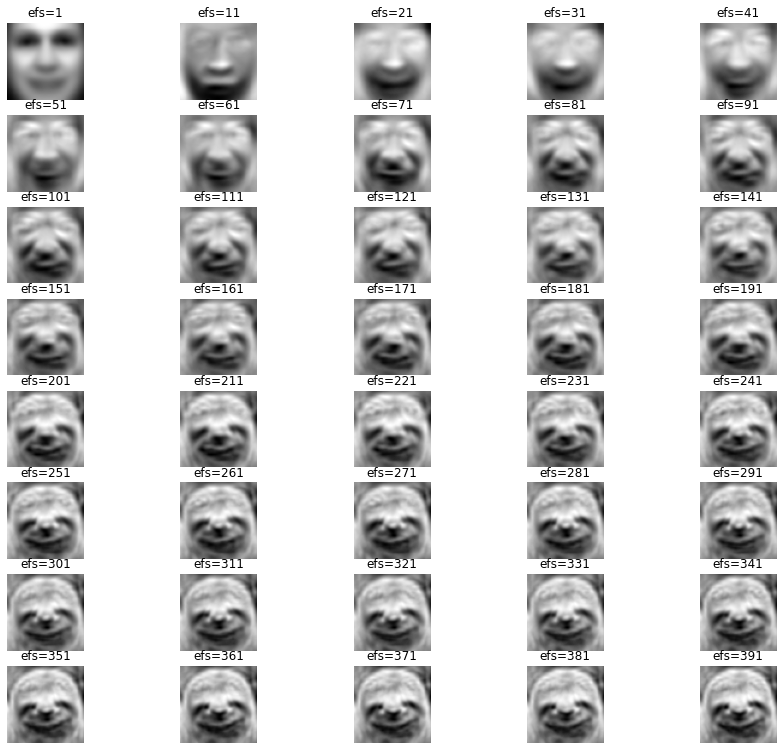

In [ ]:
plt.figure(figsize=(15,20))
k=4096
stop=400

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pere.reshape([4096])-psi)

for i,k in enumerate(range(1,stop+1,10)):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  plt.subplot(12,5,i+1)
  plt.title('efs='+str(k))
  plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
  plt.axis('off')
plt.show()

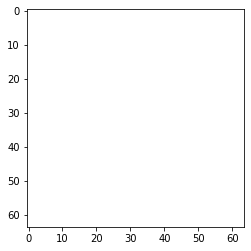

In [ ]:
fig=plt.figure()
k=4096
stop=4096
ims=[]

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,tigre.reshape([4096])-psi)

for k in range(1,stop+1,):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani4 = animation.ArtistAnimation(fig, ims, interval=25, blit=True,
                                repeat_delay=1000)

In [ ]:
HTML(ani4.to_html5_video())

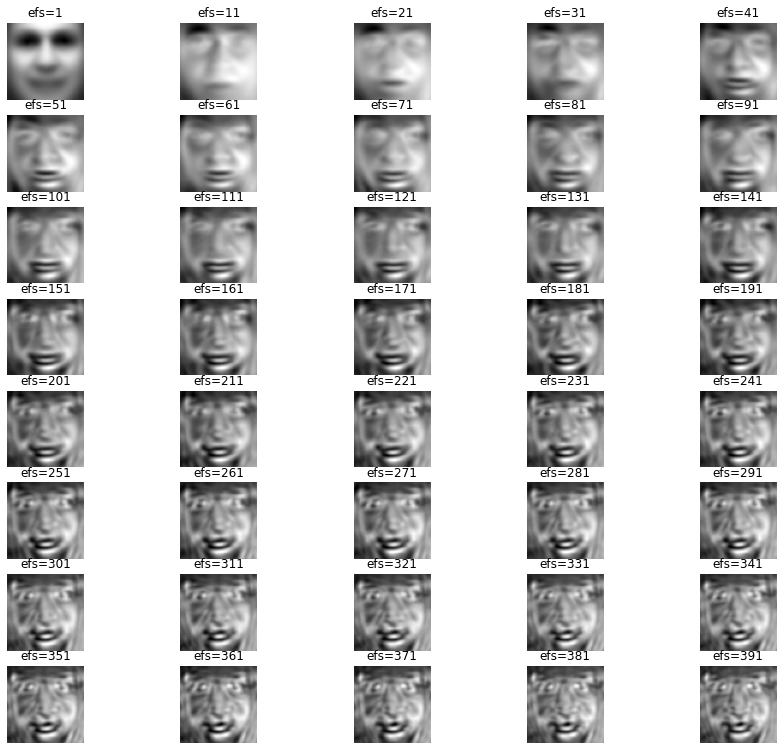

In [ ]:
plt.figure(figsize=(15,20))
k=4096
stop=400

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,tigre.reshape([4096])-psi)

for i,k in enumerate(range(1,stop+1,10)):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  plt.subplot(12,5,i+1)
  plt.title('efs='+str(k))
  plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
  plt.axis('off')
plt.show()

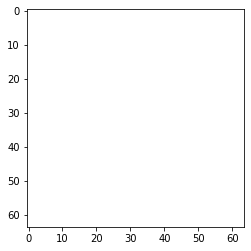

In [ ]:
fig=plt.figure()
k=4096
stop=4096
ims=[]

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pico.reshape([4096])-psi)

for k in range(1,stop+1,):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani5 = animation.ArtistAnimation(fig, ims, interval=25, blit=True,
                                repeat_delay=1000)

In [ ]:
HTML(ani5.to_html5_video())

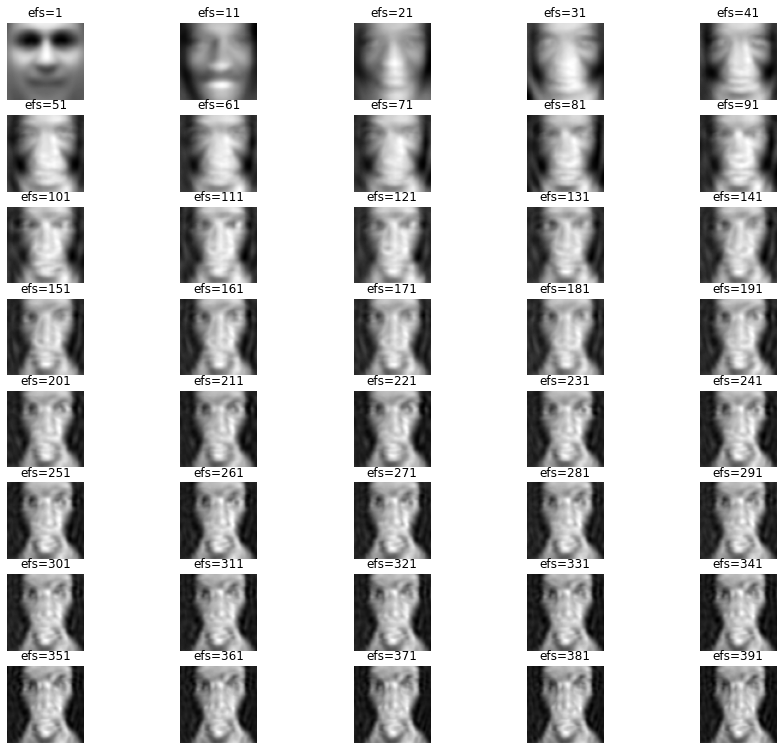

In [ ]:
plt.figure(figsize=(15,20))
k=4096
stop=400

ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pico.reshape([4096])-psi)

for i,k in enumerate(range(1,stop+1,10)):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  plt.subplot(12,5,i+1)
  plt.title('efs='+str(k))
  plt.imshow(recon+psi.reshape([64,64]),cmap='gray')
  plt.axis('off')
plt.show()

Impresionantemenete las eigenfaces humanas lograron reconstruir las caras de los animales. Nótese que mientras más alejadas las caras de los animales están de las humanas se necesitan de más eigenfaces para tener un resultado bueno siendo la más complicada la del picozapato el cual no tiene una nariz ni una boca definidos.

Ahora vamos a comparar los errores de reconstrucción para las dos imágenes de las caras y de los animales

In [ ]:
def errorreco(imagen,k,stop):
  error=[]

  ind=np.flipud(np.argsort(lam2))[:k]
  uk=v2[:,ind]
  kcoef=np.matmul(uk.T,imagen)

  for i,k in enumerate(range(1,stop+1)):
    recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
    recon=recon.reshape([64,64])
    diff=abs(recon+psi.reshape([64,64])-(imagen+psi).reshape([64,64]))
    err=sum(sum(diff))
    error.append([err])
  
  return error

[-56.62336583 -58.42628278 -54.63651477 ...  27.78757651  25.61119927
  27.20683141]
[[131531.91373904198], [112471.52386308603], [110484.77031103578], [109945.8898210711], [109573.25326567887], [108039.9605553302], [108178.5113909138], [107708.63454567063], [105433.7973869239], [104055.4439228799], [103712.00866791277], [97627.05945128869], [96742.33577777036], [81879.09346205731], [81506.549714458], [81457.71625527096], [81439.24541817303], [81235.74913624737], [80439.69956627535], [79971.56189133666], [79898.41091922588], [79699.61148123472], [73371.13783706521], [71847.4215915999], [71826.04339279399], [70189.91991679548], [70165.6854952317], [68757.52232473981], [68750.5164954178], [66763.71099265036], [66663.51800569176], [66681.54287483991], [66630.81443143205], [66614.56600923734], [66615.81345765827], [66648.83656683803], [65632.4479847655], [65717.10563242543], [65771.02804558893], [65425.120698889776], [65435.03364739115], [65170.27703813922], [63996.73133754876], [63962.293

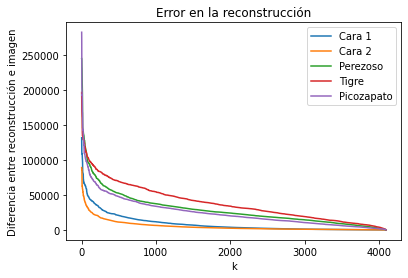

In [ ]:
imagen=[phi[0,:],phi[1,:],pere.reshape([4096])-psi,tigre.reshape([4096])-psi,pico.reshape([4096])-psi]
label=['Cara 1','Cara 2', 'Perezoso', 'Tigre', 'Picozapato']
k=4096
stop=4096
for i,j in enumerate(imagen):
  print(j)
  error=errorreco(j,k,stop)
  print(error)
  plt.plot(np.linspace(1,4096,4096),error,label=label[i])
plt.legend()
plt.title('Error en la reconstrucción')
plt.xlabel('k')
plt.ylabel('Diferencia entre reconstrucción e imagen')
plt.show()

[36.30443417 46.93031722 46.43348523 ... 25.75877651 31.58239927
 33.17803141]
[[244402.91066367598], [243822.07603922285], [232071.93745525472], [231434.40430616678], [231288.77946014388], [224691.5533400723], [216665.45057693988], [207799.6399739255], [203202.98851388806], [203267.56788806798], [194359.18402303968], [162032.7859955254], [145394.01442560233], [145195.62611704998], [145118.041588134], [143216.40697865817], [143159.6094413213], [143015.9857498025], [141219.79285989358], [140928.25842869323], [140844.11650649091], [141054.47203061302], [138572.5059551989], [138977.9175269708], [137144.3569866288], [136761.63118412325], [136667.43192893188], [134946.70970029692], [134802.6721624325], [134674.56815997793], [134629.57052017917], [133319.010362678], [130324.31975756514], [129331.53958624435], [129426.73351720082], [128997.62615214507], [127830.756706308], [127683.00620226027], [126825.90055278504], [126947.45597147114], [126983.39583533004], [124894.19685079787], [124447.265

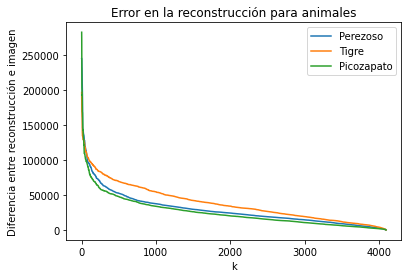

In [ ]:
imagen=[pere.reshape([4096])-psi,tigre.reshape([4096])-psi,pico.reshape([4096])-psi]
label=['Perezoso', 'Tigre', 'Picozapato']
k=4096
stop=4096
for i,j in enumerate(imagen):
  print(j)
  error=errorreco(j,k,stop)
  print(error)
  plt.plot(np.linspace(1,4096,4096),error,label=label[i])
plt.legend()
plt.title('Error en la reconstrucción para animales')
plt.xlabel('k')
plt.ylabel('Diferencia entre reconstrucción e imagen')
plt.show()

Vemos que los animales tienen mayor diferencia entre su reconstrucción y la imagen original respecto a las dos caras humanas. Sin embargo, al usar suficientes eigenfaces es posible reducir estas diferencias hasta que al usar todas se llega a diferencias muy pequeñas por lo que se confirma que el algorimto y las eigenfaces calculadas permiten calcular caras de animales.

Centrándonos en los animales, vemos que el picozapato es el animal con mayores diferencias al usar pocas eigenfaces. Sin embargo al aumentar el número de k, las diferencias decaen más rápido que para los otros animales donde el animal donde decae menos es el tigre.

## Face Morphing

Lo que sigue es pasar de una cara a otra por medio de las eigenfaces.

Los pasos del algoritmo son los siguientes:



1.   Para la primera cara se crea una reconstrucción usando un número pequeño de k eigenfaces.
2.   Iterativamente reconstruye la primera cara usando menos y menor eigenfaces.
3.  Se debe detener cuando se haya llegado a la reconstrucción de la primera cara con sólo k eigenfaces.
4. Ahora se calculan los coeficientes de la segunda cara usando esas k eigenfaces.
5. Después se usan los coeficientes del segundo en lugar de los del primero.
6. Por último de forma iterativa se incrementa el número de eigenfaces para la reconstrucción de la segunda cara hasta que todas las eigenfaces se usen.

Por como esta descrito el algoritmo, se puede entender que se puede calcular los coeficientes y luego hacer la suma con los eigenvectores lo que podría reducir el tiempo en el que se tarda en correr el algorimo de reconstrucción. Sin embargo se debe ver como se corta la multiplicación de matrices para lograrlo. Al aplicarlo en la siguiente parte se regresó y se aplicó para todos.

Se usaran como máximo 1000 eigenfaces para hacer más rápido la compilación y se tendrá como mínimo unas 10 eigenfaces.


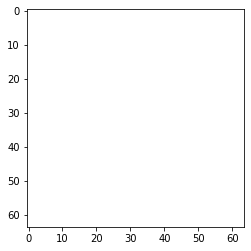

In [ ]:
fig=plt.figure()
ims=[]
im=0
k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for k in range(stop,mink,-1):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

im=1
k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for k in range(mink,stop):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani6 = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

plt.show()


In [ ]:
HTML(ani6.to_html5_video())

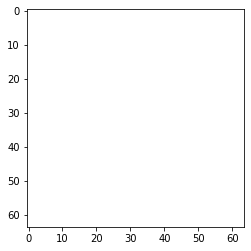

In [ ]:
fig=plt.figure()
ims=[]
im=0
k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for k in range(stop,mink,-1):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pere.reshape([4096])-psi)

for k in range(mink,stop):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani7 = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

plt.show()

In [ ]:
HTML(ani7.to_html5_video())

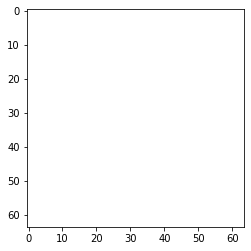

In [ ]:
fig=plt.figure()
ims=[]
im=1
k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,phi[im,:])

for k in range(stop,mink,-1):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])


k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pico.reshape([4096])-psi)

for k in range(mink,stop):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani8 = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

plt.show()

In [ ]:
HTML(ani8.to_html5_video())

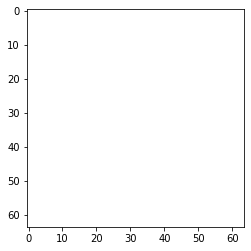

In [ ]:
fig=plt.figure()
ims=[]
k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pere.reshape([4096])-psi)

for k in range(stop,mink,-1):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])


k=4096
stop=1000
mink=10
ind=np.flipud(np.argsort(lam2))[:k]
uk=v2[:,ind]
kcoef=np.matmul(uk.T,pico.reshape([4096])-psi)

for k in range(mink,stop):
  recon=np.matmul(kcoef[:k].T,uk[:,:k].T)
  recon=recon.reshape([64,64])
  #print(recon.shape)
  imani=plt.imshow(recon+psi.reshape([64,64]),cmap='gray',animated=True)
  ims.append([imani])

ani9 = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

plt.show()

In [ ]:
HTML(ani9.to_html5_video())